In [3]:
#Notes
#Formation- Cycles 1-10
#11- C/10, 12- C/5, 13- C/2, 14-1C, 15-2C
#16-65- C/2
#66- C/10, 67-C/5, 68-C/2, 69-1C, 70-2C

In [72]:
#import statements
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import openpyxl
import numpy as np
import scipy
import os

In [5]:
def get_filenames(folder_directory): #retrieves all files in directory and subdirectories 
    allfiles=list()
    titles=list()
    for file in os.listdir(folder_directory):
        if file.endswith(""):
            titles.append(file.split('.',1)[0])
            allfiles.append(os.path.join(folder_directory, file))
    return allfiles

In [14]:
files=get_filenames("/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/")
#print(files)

In [7]:
def analyze_filename(filename):
    #A-EC(Solvent Mass) 30%, EMC (% Solvent Mass) 70%, LiPF6 1M
    #B-FM2 (Solvent Mass) 15%, EC (% Solvent Mass) 27.66, EMC (% Solvent Mass) 55.33, VC (% Solvent Mass) 2 LiPF6 1M
    #C-FM2 (Solvent Mass) 15%, EC (% Solvent Mass) 27.66, EMC (% Solvent Mass) 55.33, VC (% Solvent Mass) 2 LiPF6 1.2M
    #D-FM2 (Solvent Mass) 15%, EC (% Solvent Mass) 27.66, EMC (% Solvent Mass) 55.33, VC (% Solvent Mass) 2 LiPF6 1.5M
    
    identifier=filename.split("/")[-1].split(" ")[1]
    cell_num=filename.split("/")[-1].split(" ")[-1]
    if identifier=="A":
        FM2=0
        EC=30
        EMC=70
        VC=0
        LiPF6=1
    elif identifier=="B":
        FM2=15
        EC=27.66
        EMC=55.33
        VC=2
        LiPF6=1
    elif identifier=="C":
        FM2=15
        EC=27.66
        EMC=55.33
        VC=2
        LiPF6=1.2
    elif identifier=="D":
        FM2=15
        EC=27.66
        EMC=55.33
        VC=2
        LiPF6=1.5
    else:
        FM2=0
        EC=0
        EMC=0
        VC=0
        LiPF6=0
    return FM2, EC, EMC, VC, LiPF6,cell_num

In [8]:
def charge_capa_by_cycle(filename,dest):
    df=pd.read_csv(filename,delimiter="\t",skiprows=1,index_col=0)
    max_charge_cap_tuple=list()
    FM2,EC,EMC,VC,LiPF6,cell_num=analyze_filename(filename) #use filename to retrieve composition of battery cell
    #print(df)
    #Charge Capacity by Cycle
    for cycle in range(df["Cyc#"].min(),(df["Cyc#"].max()+1)): #go through every cycle of data
        charging=df[(df["State"]=="C")&(df["Cyc#"]==cycle)] #split the data into a)the cycle currently looking at, b)charge state
        max_charge_cap_tuple.append((cycle,charging["Amp-hr"].max()*1000,FM2,EC,EMC,VC,LiPF6,cell_num))#add all the info on max capacity and associated params into a tuple to make data acccessibility and point identification easier

    #print(max_charge_cap_tuple)
    cyc,capa,FM2,EC,EMC,VC,LiPF6,cell_num=zip(*max_charge_cap_tuple) #unzip all the tuple data collected (every info piece for every cycle)

    #Plot charge capacity by cycle
    plt.figure(figsize=(16,9), dpi=300)
    plt.xlabel("Cycle")
    plt.ylabel("Capacity(mAmp-hr)")
    title_string=filename.split("/")[-1]+" CHARGE "+" ("+"FM2 (solvent wt%):"+str(FM2[0])+ " EC (solvent wt%):"+str(EC[0])+" EMC (solvent wt%):"+str(EMC[0])+" VC (solvent wt%):"+str(VC[0])+" LiPF6 :"+str(LiPF6[0])+"M"
    plt.title(title_string)
    plt.bar(cyc,capa)
    exit_filename=dest+filename.split("/")[-1]+".jpg"
    plt.savefig(exit_filename)
    plt.close()

def discharge_capa_by_cycle(filename,dest): #same code as above just for discharge
    df=pd.read_csv(filename,delimiter="\t",skiprows=1,index_col=0)
    #Discharge Capacity by Cycle
    max_discharge_cap_tuple=list()
    FM2,EC,EMC,VC,LiPF6,cell_num=analyze_filename(filename)
    for cycle in range(df["Cyc#"].min(),(df["Cyc#"].max()+1)):
        discharging=df[(df["State"]=="D")&(df["Cyc#"]==cycle)]
        max_discharge_cap_tuple.append((cycle,discharging["Amp-hr"].max()*1000,FM2,EC,EMC,VC,LiPF6,cell_num))

    #print(max_discharge_cap_tuple)
    dcyc,dcapa,FM2_d,EC_d,EMC_d,VC_d,LiPF6_d,cell_num_d=zip(*max_discharge_cap_tuple)

    plt.figure(figsize=(16,9), dpi=300)
    plt.xlabel("Cycle")
    plt.ylabel("Capacity(mAmp-hr)")
    title_string_d=filename.split("/")[-1]+" DISCHARGE "+" ("+"FM2 (solvent wt%):"+str(FM2_d[0])+ " EC (solvent wt%):"+str(EC_d[0])+" EMC (solvent wt%):"+str(EMC_d[0])+" VC (solvent wt%):"+str(VC_d[0])+" LiPF6 :"+str(LiPF6_d[0])+"M"
    plt.title(title_string_d)
    #print(title_string_d)
    plt.bar(dcyc,dcapa)
    exit_filename=dest+filename.split("/")[-1]+".jpg"
    plt.savefig(exit_filename)
    plt.close()

In [51]:
destination_folder_charge_by_cycle="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Charge_by_Cycle/"
destination_folder_discharge_by_cycle="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Discharge_by_Cycle/"
#go thorugh every found file in the data folder, ignore those that do not have data in them and throw and error
for file in files:
    try:
        charge_capa_by_cycle(file,destination_folder_charge_by_cycle)
        discharge_capa_by_cycle(file,destination_folder_discharge_by_cycle)
    except:
        print(file)

/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/.DS_Store
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Charge_by_Cycle
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Discharge_by_Cycle


In [9]:
def nom_capacity(filename,list_of_cycles,to_save,dest): #figure out nominal capacity (q) based on fitting a curve between the discharge capacity and current at that max
    df=pd.read_csv(filename,delimiter="\t",skiprows=1,index_col=0) #read in data
    FM2,EC,EMC,VC,LiPF6,cell_num=analyze_filename(filename) #extract params again
    q_data=list()
    for cycle in list_of_cycles:
        data=df[(df["State"]=="D")&(df["Cyc#"]==cycle)] #Discharge Capacity is referred to as "capacity"
        amp_max=data.loc[data[data["Amp-hr"]==data["Amp-hr"].max()].index[0]]["Amps"] #get amps at position of max capacity
        q_data.append((cycle,data["Amp-hr"].max()*1000,amp_max*1000))
    #print(q_data)
    cyc,cap,amp=zip(*q_data)
    
    
    a,b,c=np.polyfit(amp,cap,2) #fit the data to a quadratic
    if to_save==True:
        fig=plt.figure(figsize=(16,9), dpi=300)
        ax=fig.add_subplot()
        ax.scatter(amp,cap)
        plt.xlim([0,max(amp)])
        plt.ylabel("Capacity (mAmp-hr)")
        plt.xlabel("Current (mAmp)")
        x=np.linspace(0,10,50)
        title_string=filename.split("/")[-1]+" ("+"FM2 (solvent wt%):"+str(FM2)+ " EC (solvent wt%):"+str(EC)+" EMC (solvent wt%):"+str(EMC)+" VC (solvent wt%):"+str(VC)+" LiPF6 :"+str(LiPF6)+"M"
        plt.title(title_string)
        ax.plot(x,a*np.power(x,2)+b*np.power(x,1)+c)
        ax.text(0.85,0.95,"Q:"+str(round(c,3))+" mAmp-hr",transform=ax.transAxes)
        exit_filename=dest+filename.split("/")[-1]+".jpg"
        plt.savefig(exit_filename)
        plt.close()
        
    return c #return the intercept which is the nominal capacity

In [10]:
def soc_cr(filename,q,list_of_cycles,dest,to_save): #using Q value (mAmp-hr), normalize discharge capacity (capacity) into SOC and Current into c-rate
    df=pd.read_csv(filename,delimiter="\t",skiprows=1,index_col=0)
    FM2,EC,EMC,VC,LiPF6,cell_num=analyze_filename(filename)
    q_data=list()
    for cycle in list_of_cycles:
        data=df[(df["State"]=="D")&(df["Cyc#"]==cycle)] #Discharge Capacity is referred to as "capacity"
        amp_max=data.loc[data[data["Amp-hr"]==data["Amp-hr"].max()].index[0]]["Amps"] #get amps at position of max capacity
        q_data.append((cycle,data["Amp-hr"].max()*1000,amp_max*1000,data["Amp-hr"].max()*1000/q*100,amp_max*1000/q))
    print(q_data)
    cyc,cap,amp,soc,cr=zip(*q_data)
    
    if to_save==True:
        fig=plt.figure(figsize=(16,9), dpi=300)
        ax=fig.add_subplot()
        ax.scatter(cr,soc)
        plt.xlabel("CR [1/hr]")
        plt.ylabel("SOC (%)")
        title_string=filename.split("/")[-1]+" ("+"FM2 (solvent wt%):"+str(FM2)+ " EC (solvent wt%):"+str(EC)+" EMC (solvent wt%):"+str(EMC)+" VC (solvent wt%):"+str(VC)+" LiPF6 :"+str(LiPF6)+"M"
        plt.title(title_string)
        exit_filename=dest+filename.split("/")[-1]+".jpg"
        plt.savefig(exit_filename)
        plt.close()

In [67]:
def cycle_values(filename,q,exp1,exp2,exp3,exp_csv):
    #to get delE, avgq, delv_nomv (nomv is 3.7 V)
    df=pd.read_csv(filename,delimiter="\t",skiprows=1,index_col=0)
    FM2,EC,EMC,VC,LiPF6,cell_num=analyze_filename(filename);
    cycle_tuple=list()
    nom_cap=nom_capacity(filename,range(11,16),False,"")
    
    charging_Wh=df[(df["State"]=="C")&(df["Cyc#"]==10)]["Watt-hr"].max() #hard coded to cycle before rate testing
    
    for cycle in range(df["Cyc#"].min(),(df["Cyc#"].max())):
        #print(cycle)
        discharging_Wh=df[(df["State"]=="D")&(df["Cyc#"]==cycle)]["Watt-hr"].max()
        del_e=charging_Wh-discharging_Wh
        #print(del_e)
        
        charging_Ah=df[(df["State"]=="C")&(df["Cyc#"]==cycle)]["Amp-hr"].max()
        discharging_Ah=df[(df["State"]=="D")&(df["Cyc#"]==cycle)]["Amp-hr"].max()
        avg_q=(charging_Ah+discharging_Ah)/2
        #print(avg_q)
        
        delV_nomV=del_e/discharging_Ah/3.7 *100
        
        soc=discharging_Ah*1000/q*100
        sub=df[(df["State"]=="D")&(df["Cyc#"]==cycle)]
        amp_max=sub.loc[sub[sub["Amp-hr"]==discharging_Ah].index[0]]["Amps"] #get the current at the max state of discharge capacity
        #print(amp_max)
        cr=amp_max*1000/q
        
        cycle_tuple.append((cycle,del_e,avg_q,delV_nomV,soc,cr,discharging_Ah*1000))
    c,de,aq,dvnv,soc,cr,discharge_Ah=zip(*cycle_tuple)
    exp_frame=pd.DataFrame(cycle_tuple, columns=["Cycle","dE","avg_q","dVnV","soc","cr","discharge capacity"])
    csv_filename=exp_csv+filename.split("/")[-1]+".csv"
    exp_frame.to_csv(csv_filename)
    
    #(del.V/nom.V) v Cycle with SOC v Cycle
    fig,ax=plt.subplots(2)
    fig.set_figwidth(16)
    fig.set_figheight(9)
    fig.set_dpi(300)
    ax[0].scatter(c,dvnv)
    ax[1].set(xlabel="Cycle")
    ax[0].set(ylabel="DeltaV/NomV (%)")
    ax[1].set(ylabel="SOC (%)")
    ax[1].scatter(c,soc)
    title_string_d=filename.split("/")[-1]+" ("+"FM2 (solvent wt%):"+str(FM2)+ " EC (solvent wt%):"+str(EC)+" EMC (solvent wt%):"+str(EMC)+" VC (solvent wt%):"+str(VC)+" LiPF6 :"+str(LiPF6)+"M"
    ax[0].set_title(title_string_d)
    exit_filename1=exp1+filename.split("/")[-1]+".jpg"
    fig.savefig(exit_filename1,dpi=300)
    
    
    #(del.V/nom.V) v CR to corresponding SOC v CR plots 
    fig2,ax2=plt.subplots(2)
    fig2.set_figwidth(16)
    fig2.set_figheight(9)
    fig2.set_dpi(300)
    ax2[0].scatter(cr,dvnv)
    ax2[1].set(xlabel="CR")
    ax2[0].set(ylabel="DeltaV/NomV (%)")
    ax2[1].set(ylabel="SOC (%)")
    ax2[1].scatter(cr,soc)
    title_string_d=filename.split("/")[-1]+" ("+"FM2 (solvent wt%):"+str(FM2)+ " EC (solvent wt%):"+str(EC)+" EMC (solvent wt%):"+str(EMC)+" VC (solvent wt%):"+str(VC)+" LiPF6 :"+str(LiPF6)+"M"
    ax2[0].set_title(title_string_d)
    exit_filename2=exp2+filename.split("/")[-1]+".jpg"
    fig2.savefig(exit_filename2,dpi=300)
    
    plt.figure(figsize=(16,9), dpi=300)
    plt.scatter(c,np.divide(dvnv,soc))
    plt.xlabel("Cycle")
    plt.ylabel("(DeltaV/NomV)(%)/SOC(%)")
    plt.title(title_string_d)
    exit_filename3=exp3+filename.split("/")[-1]+".jpg"
    plt.savefig(exit_filename3)

In [68]:
destination_folder_q="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Q Calc Graphs/"
destination_folder_soc_cr_first="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/SOC_CR First/"
destination_folder_soc_cr_second="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/SOC_CR Second/"


for file in files:
    try:
        soc_cr(file,nom_capacity(file,range(11,16),True,destination_folder_q),range(11,16),destination_folder_soc_cr_first,True)
    except:
        print(file)

[(11, 2.584304, 0.5284960000000001, 98.08098916288341, 0.2005778362322205), (12, 2.469562, 1.3209739999999999, 93.72623490079675, 0.501343636733336), (13, 2.3602179999999997, 2.641795, 89.57634863392323, 1.0026292060282367), (14, 2.150243, 5.284962, 81.60725687866672, 2.0057791213736875), (15, 2.45213, 1.3209739999999999, 93.06464562837084, 0.501343636733336)]
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/.DS_Store
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/dVnV_and_SOC_Cycle
[(11, 2.739375, 0.528344, 97.45132013799342, 0.18795462573392838), (12, 2.6129399999999996, 1.320821, 92.95348480634031, 0.46987269036179646), (13, 2.4654719999999997, 2.6421, 87.7074154371924, 0.9399083109709055), (14, 2.216868, 5.284962, 78.86350469419966, 1.8800876980301346), (15, 2.608192, 1.320821, 92.78457807834025, 0.46987269036179646)]
[(11, 2.789712, 0.528267, 97.61544817107328, 0.18484710951879035), (12, 2.656028, 1.320897, 92.93768086989604, 0

/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/.DS_Store
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/dVnV_and_SOC_Cycle


/var/folders/k3/jjb598g15j116d3wjszpjjn80000gn/T/ipykernel_26072/1510336603.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,9), dpi=300)


/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/dVnV_SOC_Cycle
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/dVnV_SOC_CR
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/SOC_CR First
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Charge_by_Cycle
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Discharge_by_Cycle
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/SOC_CR Second
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Data
/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Q Calc Graphs


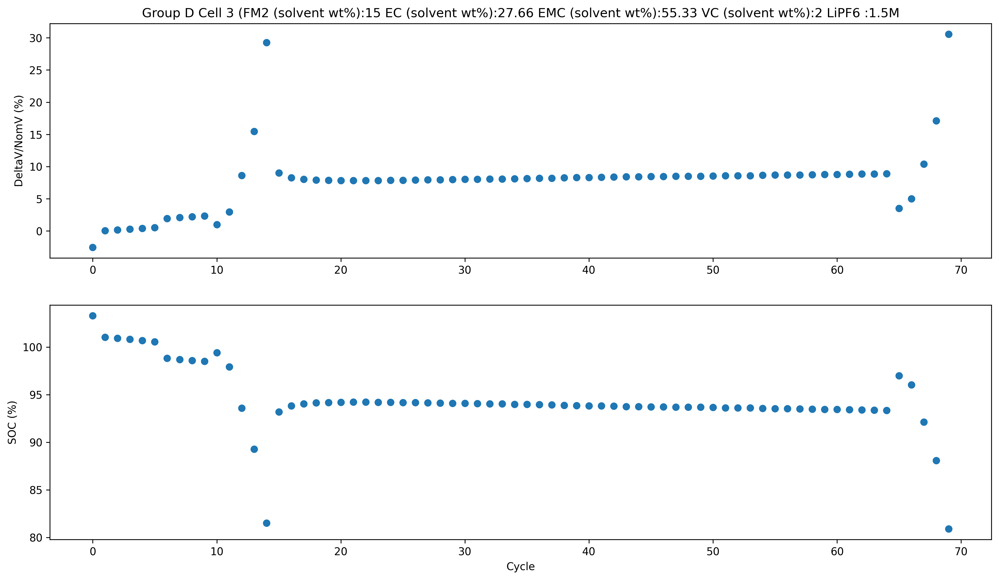

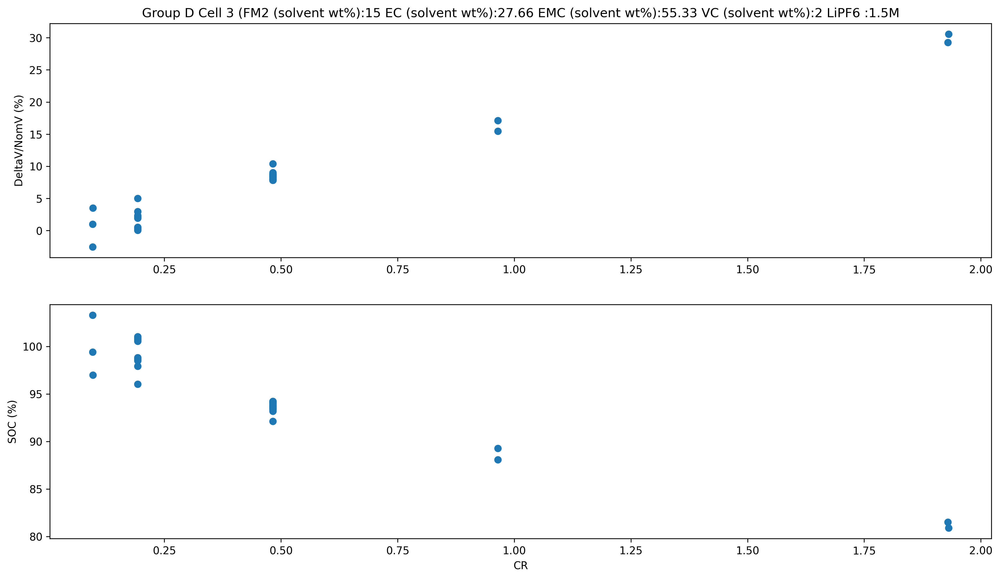

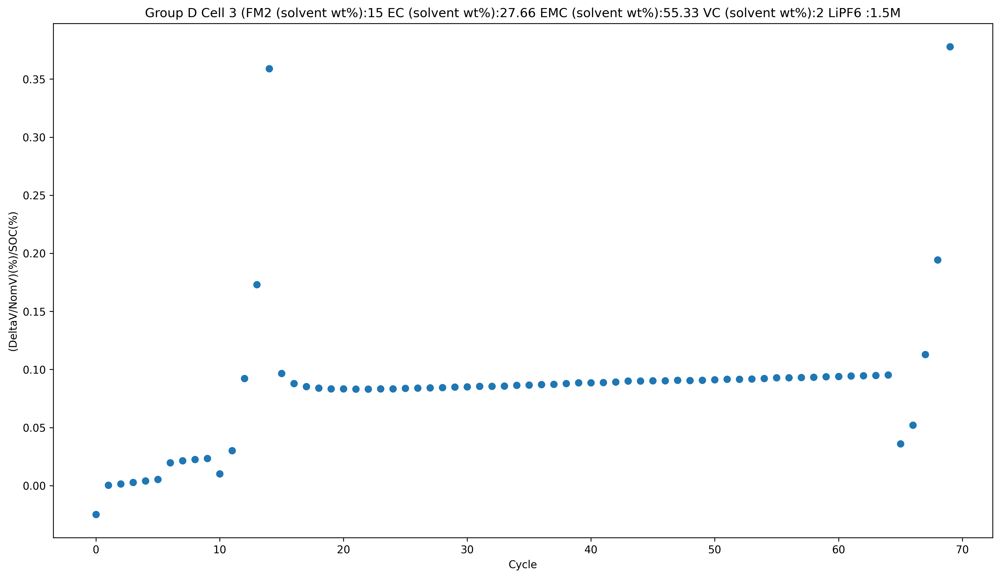

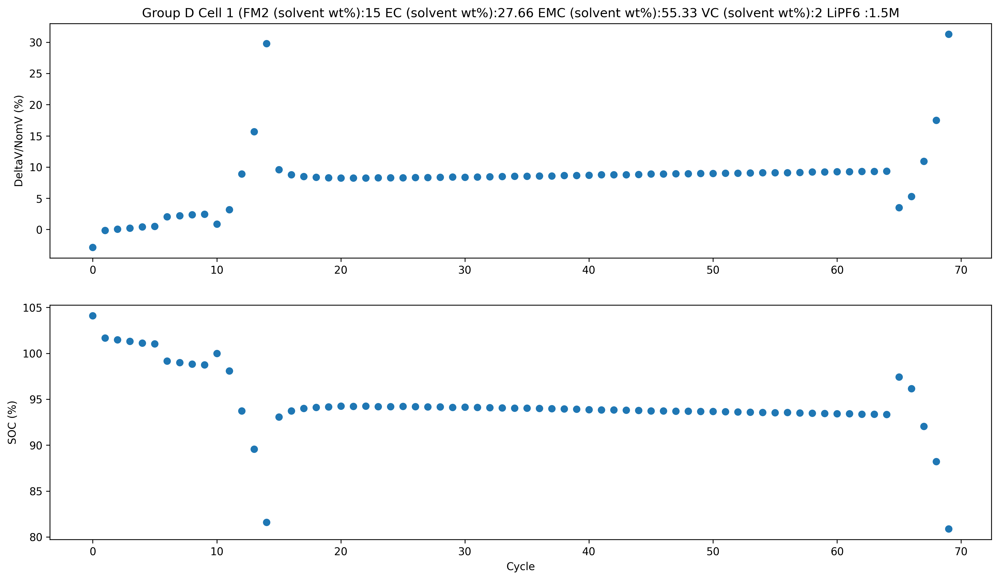

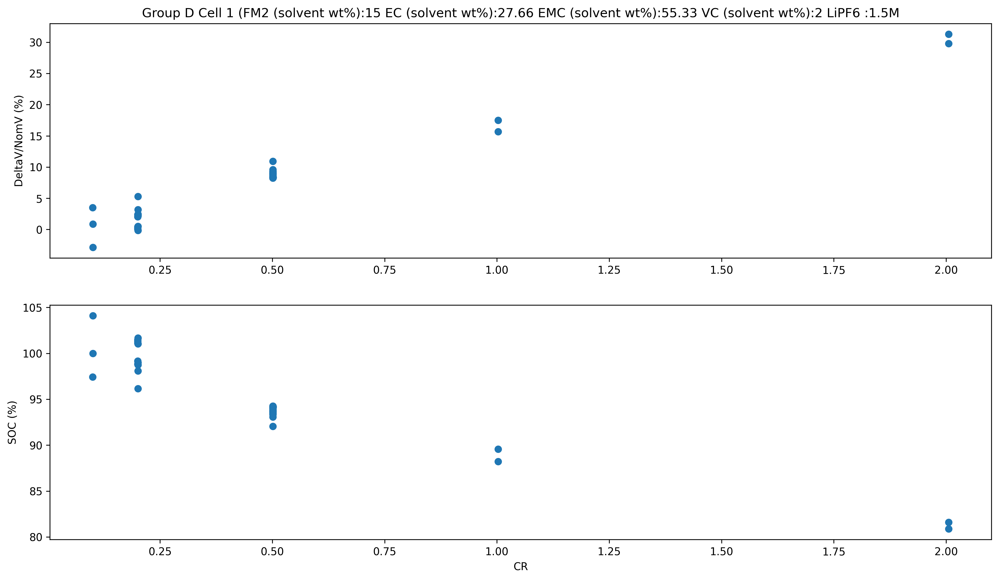

...

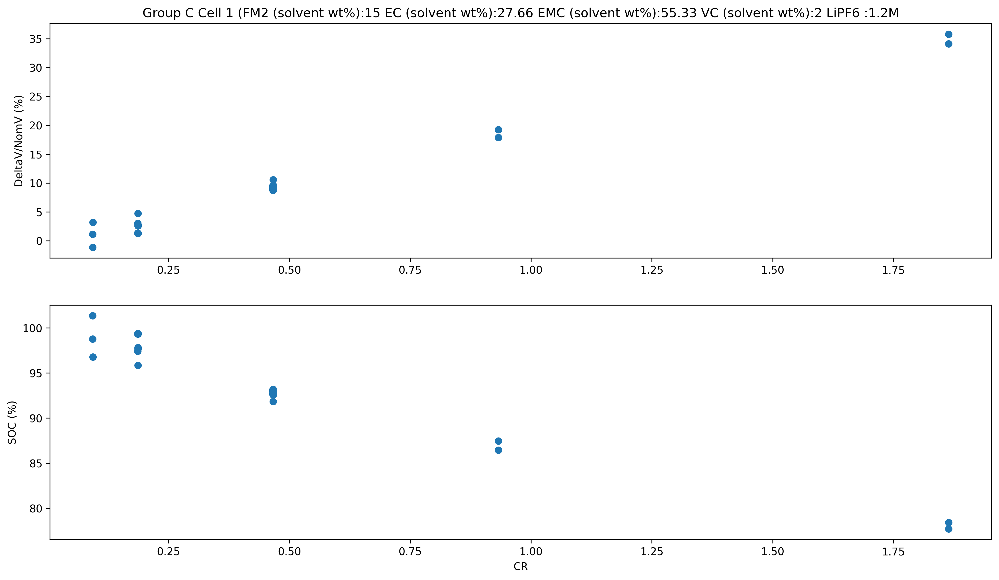

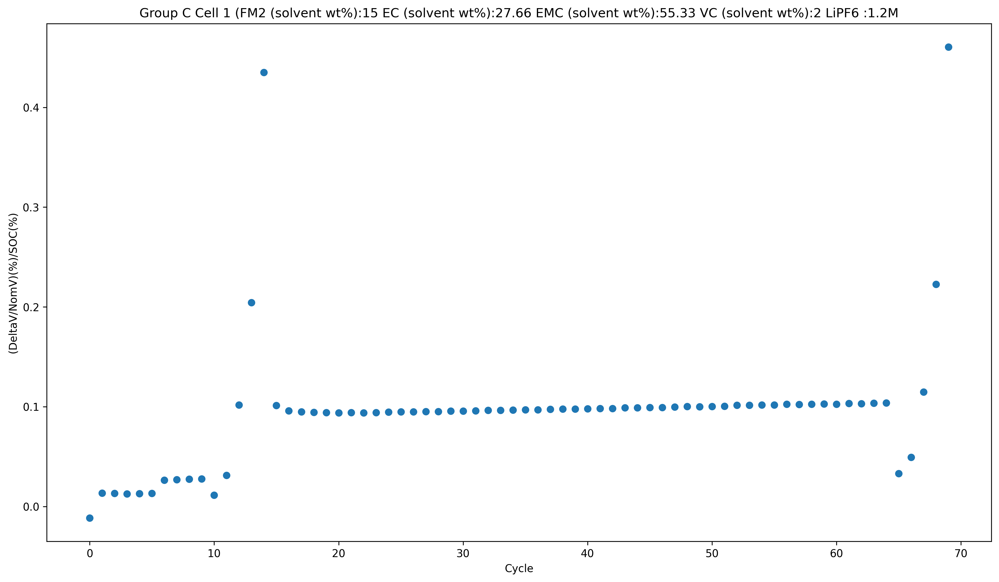

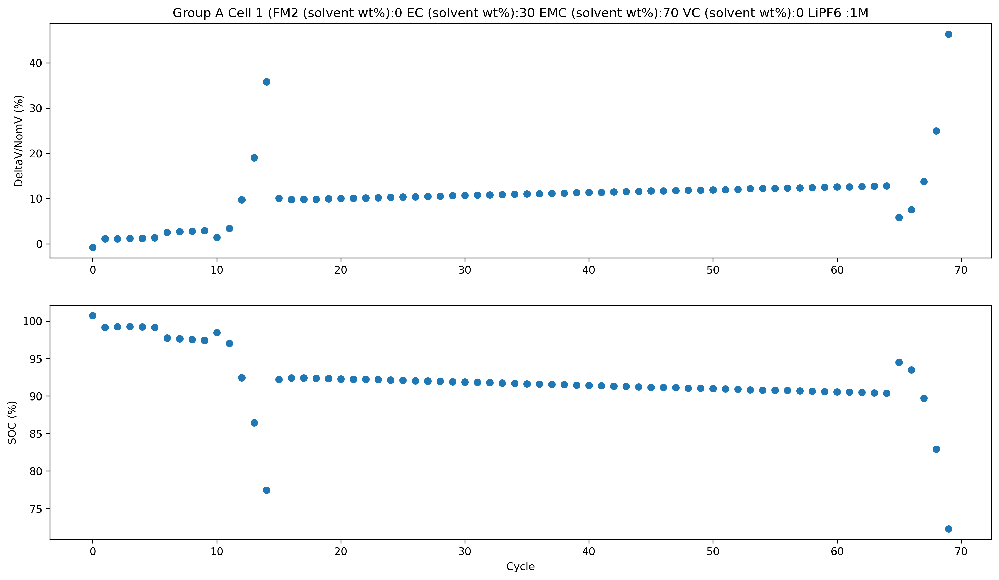

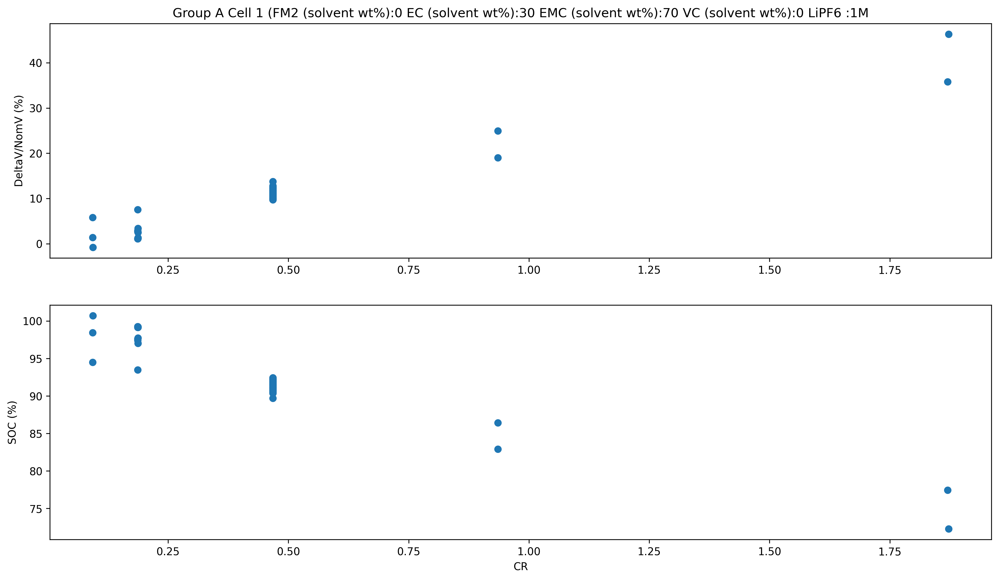

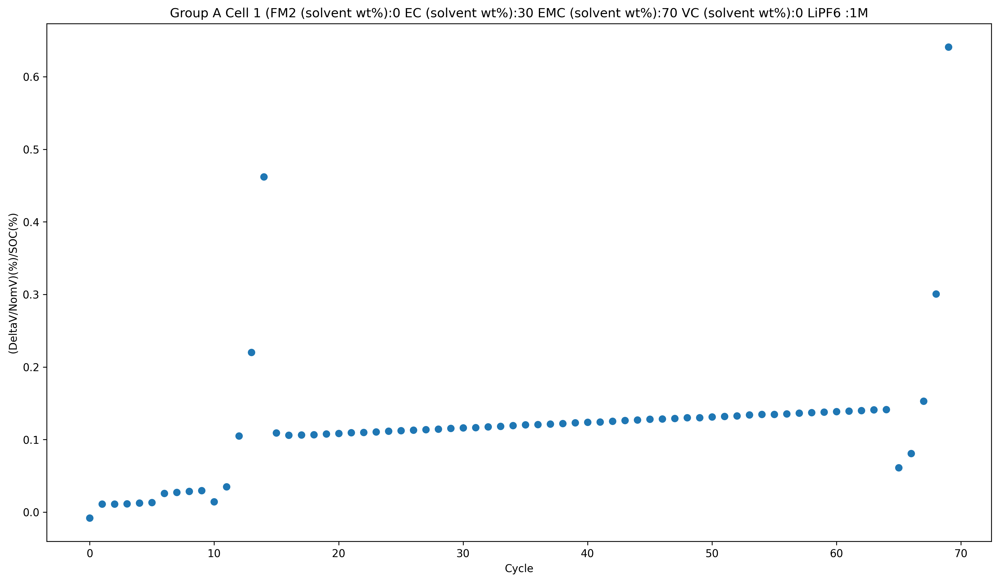

In [69]:
dvnv_ext="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/dVnV_and_SOC_Cycle/"
dvnv_soc_cr="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/dVnV_SOC_CR/"
dvnv_soc_cyc="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/dVnV_SOC_Cycle/"
cyc_csv="/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/CSV Cycle Data/"

cycle_values(files[15],nom_capacity(files[15],range(11,16),False,""),dvnv_ext,dvnv_soc_cr,dvnv_soc_cyc,cyc_csv)

for file in files:
    try:
        cycle_values(file,nom_capacity(file,range(11,16),False,""),dvnv_ext,dvnv_soc_cr,dvnv_soc_cyc,cyc_csv)
    except:
        print(file)

In [118]:
def group_analysis(csv_directory,key,cycle_nums,dest,rate_cycle,to_save=True): #key is group letter identifier (A/B/C/D), cycle nums is cycles to analyze
    #this method depends on having run cycle_values first to output a csv of each cycle's values
    allfiles=list()
    for file in os.listdir(csv_directory):
        if file.split(" ")[1]==key:
            allfiles.append(os.path.join(csv_directory, file))
    
    composite_df=pd.DataFrame()
    for file in allfiles:
        df=pd.read_csv(file)
        df=df[df["Cycle"].isin(cycle_nums)]
        composite_df=composite_df.append(df)
    
    tuple_set=list()
    for cycle in cycle_nums:
        df_cycle=composite_df[composite_df["Cycle"]==cycle]
        avg_dvnv=np.average(df_cycle["dVnV"])
        std_dvnv=np.std(df_cycle["dVnV"])
        avg_cr=np.average(df_cycle["cr"])
        std_cr=np.std(df_cycle["cr"])
        avg_soc=np.average(df_cycle["soc"])
        std_soc=np.std(df_cycle["soc"])
        tuple_set.append((cycle,avg_dvnv,std_dvnv,avg_cr,std_cr,avg_soc,std_soc))
    
    c,a_dvnv,s_dvnv,a_cr,s_cr,a_soc,s_soc=zip(*tuple_set)
    a,b,r2,p,std=scipy.stats.linregress(a_cr,a_dvnv)
    a2,b2,r22,p2,std2=scipy.stats.linregress(a_cr,a_soc)
    
    title="Group "+key+" "+rate_cycle
    csv_filename=dest+title+" STATS.csv"
    pd.DataFrame(tuple_set,columns=["Cycle","dV/nomV Avg","dV/nomV Std","CR Avg","CR Std","SOC Avg","SOC Std"]).to_csv(csv_filename)
    
    if to_save==True:
        fig=plt.figure(figsize=(16,9), dpi=300)
        ax=fig.add_subplot()
        ax.scatter(a_cr,a_dvnv)
        plt.xlim([0,max(a_cr)])
        plt.ylabel("dV/nomV (%)")
        plt.xlabel("CR (1/hr)")
        title_string="Group "+key+" "+rate_cycle
        plt.title(title_string)
        plt.ylim(0,100)
        x=np.linspace(0,10,50)
        ax.plot(x,a*np.power(x,1)+b)
        ax.text(0.8,0.95,"dV/nomV="+str(round(a,3))+"*CR+"+str(round(b,3)),transform=ax.transAxes)
        ax.text(0.8,0.90,"R2="+str(round(r2,3)),transform=ax.transAxes)
        exit_filename=dest+title+" dVnV_CR.jpg"
        plt.savefig(exit_filename)
        plt.close()
        
        fig2=plt.figure(figsize=(16,9), dpi=300)
        ax2=fig2.add_subplot()
        ax2.scatter(a_cr,a_soc)
        plt.xlim([0,max(a_cr)])
        plt.ylabel("SOC (%)")
        plt.xlabel("CR (1/hr)")
        title_string="Group "+key+" "+rate_cycle
        plt.title(title_string)
        x=np.linspace(0,10,50)
        ax2.plot(x,a2*np.power(x,1)+b2)
        ax2.text(0.8,0.95,"dV/nomV="+str(round(a2,3))+"*CR+"+str(round(b2,3)),transform=ax2.transAxes)
        ax2.text(0.8,0.90,"R2="+str(round(r22,3)),transform=ax2.transAxes)
        exit_filename2=dest+title+" SOC_CR.jpg"
        plt.savefig(exit_filename2)
        plt.close()
    
    

In [130]:
group_analysis("/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/CSV Cycle Data","A",range(65,70),"/Users/shanmukhkutagulla/Downloads/Coin Cell Cycling Data And Summary/Data/Group Computations/","R2",True)